# Содержание

Рынок заведений общественного питания Москвы
1. [Цели исследования](#start)
2. [Загрузка и подготовка данных](#preprocessing)
    * [Описание данных](#preprocessing1)
    * [Предобработка данных](#preprocessing2)
3. [Исследование рынка заведений общественного питания](#research)
    * [Объекты общественного питания по категориям](#research1)
    * [Количество посадочных мест по категориям](#research2)
    * [Соотношение сетевых и несетевых заведений](#research3)
    * [Какие категории заведений чаще являются сетевыми?](#research4)
    * [Топ-15 популярных сетей в Москве](#research5)
    * [Административные районы](#research6)
    * [Распределение средних рейтингов по категориям заведений](#research7)
    * [Фоновая картограмма со средним рейтингом заведений каждого района](#research8)
    * [Все заведения на карте](#research9)
    * [Топ-15 улиц по количеству заведений](#research10)
    * [Улицы с одним заведением](#research11)
    * [Медианные чеки заведений по районам](#research12)
    * [Выводы](#research13)
4. [Исследование рынка кофеен](#research14)
    * [Сколько всего кофеен в датасете?](#research15)
    * [Есть ли круглосуточные кофейни?](#research16)
    * [Какие у кофеен рейтинги?](#research17)
    * [На какую стоимость чашки капучино стоит ориентироваться при открытии?](#research18)
    * [Построем визуализацию других идей](#research19)
    * [Выводы](#research20)
5. [Презентация](#presentation)
6. [Заключение](#end)
    * [Выводы](#end1)
    * [Рекомендации](#end2)

# Рынок заведений общественного питания Москвы

## Цели исследования <a id="start"></a> 
1. Нам необзодимо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места
2. Оценить целесообразность открытия кофейни. 

Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

## Загрузка и подготовка данных<a id="preprocessing"></a> 

In [1]:
#импорт библиотек
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats as st
import datetime as dt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
from plotly.offline import iplot
from IPython.display import display_html
pd.set_option('display.max_columns', 30)
pd.set_option("display.float_format", "{:.2f}".format)
pd.set_option('display.max_colwidth', 300)
import folium
import json
from folium import Map, Marker, Choropleth
from folium.plugins import MarkerCluster
from folium.features import CustomIcon
import warnings
warnings.simplefilter('ignore')
plt.rcParams.update({'figure.figsize': (15,8)})
sns.set()

In [2]:
#сформируем датасет
data = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
display (data.head())
display (data.tail())
display (data.sample(10))
display (data.describe(percentiles=[0.05, 1/4, 1/2, 3/4, 0.95, 0.99]).T)
display (data.info())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,1000.00,NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.67,37.55,4.40,NaN,NaN,NaN,NaN,0,86.00
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.64,37.66,4.80,NaN,NaN,NaN,NaN,0,150.00
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.65,37.74,3.90,NaN,Средний счёт:от 150 ₽,150.00,NaN,0,150.00
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.65,37.74,4.20,NaN,NaN,NaN,NaN,1,150.00
8405,Kebab Time,кафе,"Москва, Россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.60,37.60,3.90,NaN,NaN,NaN,NaN,0,12.00


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
8125,Иван Чай,кофейня,"Москва, Нагатинская набережная, 10, корп. 3",Южный административный округ,"ежедневно, 07:00–23:00",55.68,37.64,4.60,NaN,NaN,NaN,NaN,0,240.00
1745,Рынок и общепит,кафе,"Москва, Весковский переулок, 7",Центральный административный округ,"ежедневно, 09:00–23:00",55.78,37.60,4.50,средние,Средний счёт:1000–1500 ₽,1250.00,NaN,0,40.00
7820,Coffeplet,кафе,"Москва, Липецкая улица (дублёр)",Южный административный округ,вт-вс 10:00–20:00,55.59,37.67,3.90,NaN,NaN,NaN,NaN,0,NaN
7653,Шаверма,быстрое питание,"Москва, Профсоюзная улица, 152, корп. 2, стр. 2",Юго-Западный административный округ,"ежедневно, 10:00–23:00",55.62,37.51,4.20,NaN,NaN,NaN,NaN,1,170.00
5975,Pho Ngon,ресторан,"Москва, улица Шаболовка, 29, корп. 2",Центральный административный округ,пн-сб 10:00–22:00; вс 10:00–21:00,55.72,37.61,4.70,NaN,Средний счёт:400–500 ₽,450.00,NaN,1,130.00
4804,Хлебная лавка Бородинского,булочная,"Москва, Волочаевская улица, 9/1",Юго-Восточный административный округ,"ежедневно, 09:00–21:00",55.75,37.68,4.20,NaN,Средний счёт:300–500 ₽,400.00,NaN,0,NaN
5370,Лесное,ресторан,"Москва, Народный проспект, 17, стр. 28",Восточный административный округ,"ежедневно, 11:00–22:00",55.77,37.75,3.90,NaN,NaN,NaN,NaN,0,NaN
7648,Сокровище,"бар,паб","Москва, улица Красного Маяка, 1, корп. 1",Южный административный округ,"ежедневно, 11:00–05:00",55.61,37.60,4.00,средние,Средний счёт:600–1200 ₽,900.00,NaN,0,200.00
3888,Гамбринус,"бар,паб","Москва, Большая Дорогомиловская улица, 4",Западный административный округ,"пн-пт 11:00–00:00; сб,вс 12:00–00:00",55.75,37.57,4.60,выше среднего,Средний счёт:1000–1500 ₽,1250.00,NaN,1,NaN
2534,Яндекс Лавка,ресторан,"Москва, Погонный проезд, 3А",Восточный административный округ,"ежедневно, 07:00–02:00",55.82,37.70,4.00,NaN,NaN,NaN,NaN,1,24.00


,count,mean,std,min,5%,25%,50%,75%,95%,99%,max
lat,8406.00,55.75,0.07,55.57,55.63,55.71,55.75,55.80,55.87,55.90,55.93
lng,8406.00,37.61,0.10,37.36,37.44,37.54,37.61,37.66,37.79,37.84,37.87
rating,8406.00,4.23,0.47,1.00,3.40,4.10,4.30,4.40,4.80,5.00,5.00
middle_avg_bill,3149.00,958.05,1009.73,0.00,225.00,375.00,750.00,1250.00,2250.00,3750.00,35000.00
middle_coffee_cup,535.00,174.72,88.95,60.00,60.00,124.50,169.00,225.00,275.00,309.90,1568.00
chain,8406.00,0.38,0.49,0.00,0.00,0.00,0.00,1.00,1.00,1.00,1.00
seats,4795.00,108.42,122.83,0.00,6.00,40.00,75.00,140.00,307.00,625.00,1288.00


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

### Описание данных<a id="preprocessing1"></a> 

В таблице 8406 строк и 14 столбцов. В данных присутствует достаточно большое количество пропусков, например время работы, количество посадочных мест, цена, диапазон среднего чека, средняя цена чека. Причём в последних трёх отсутствует более половины данных, - попытка их заменить медианным и тем более средним значением приведет к сильному искажению данных. В столбце со средней ценой чашки капучино всего 535 записей (менее 10%), вероятно они относятся преимущественно к кофейням.

* `name` — название заведения;
* `address` — адрес заведения;
* `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
* `hours` — информация о днях и часах работы;
* `lat` — широта географической точки, в которой находится заведение;
* `lng` — долгота географической точки, в которой находится заведение;
* `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
* `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
* `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    * «Средний счёт: 1000–1500 ₽»;
    * «Цена чашки капучино: 130–220 ₽»;
    * «Цена бокала пива: 400–600 ₽».
    * и так далее;
* `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    * Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
* `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    * Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
* `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    * 0 — заведение не является сетевым
    * 1 — заведение является сетевым
* `district` — административный район, в котором находится заведение, например Центральный административный округ;
* `seats` — количество посадочных мест.

### Предобработка данных<a id="preprocessing2"></a> 
Произведем замену наименований столбцов на соответствующие стилю и содержанию. Поработаем с типом данных дат. Проверим дубликаты и пропуски.

In [4]:
df = data #датафрейм data оставим для контроля изменений и проверки
df.columns

Index(['name', 'category', 'address', 'district', 'hours', 'lat', 'lng',
       'rating', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup',
       'chain', 'seats'],
      dtype='object')

In [5]:
#изучим содержание датасета на предмет явных проблем
print('Количество явных дубликатов:', df.duplicated().sum())
print('=' * 45)
n=0
for column in df:
    print(f'Количество пропусков в столбце {df.columns[n]}:', df[column].isna().sum())
    print(f'Это в {(df[column].isna().sum() / df.name.count()):.2%} процентах от всех данных')
    print('=' * 45)
    print()        
    n += 1

Количество явных дубликатов: 0
Количество пропусков в столбце name: 0
Это в 0.00% процентах от всех данных

Количество пропусков в столбце category: 0
Это в 0.00% процентах от всех данных

Количество пропусков в столбце address: 0
Это в 0.00% процентах от всех данных

Количество пропусков в столбце district: 0
Это в 0.00% процентах от всех данных

Количество пропусков в столбце hours: 536
Это в 6.38% процентах от всех данных

Количество пропусков в столбце lat: 0
Это в 0.00% процентах от всех данных

Количество пропусков в столбце lng: 0
Это в 0.00% процентах от всех данных

Количество пропусков в столбце rating: 0
Это в 0.00% процентах от всех данных

Количество пропусков в столбце price: 5091
Это в 60.56% процентах от всех данных

Количество пропусков в столбце avg_bill: 4590
Это в 54.60% процентах от всех данных

Количество пропусков в столбце middle_avg_bill: 5257
Это в 62.54% процентах от всех данных

Количество пропусков в столбце middle_coffee_cup: 7871
Это в 93.64% процентах от

In [6]:
df.isna().mean()

name                0.00
category            0.00
address             0.00
district            0.00
hours               0.06
lat                 0.00
lng                 0.00
rating              0.00
price               0.61
avg_bill            0.55
middle_avg_bill     0.63
middle_coffee_cup   0.94
chain               0.00
seats               0.43
dtype: float64

6.38% потерянных данных в столбце hours, 54.60% потерянных данных в столбце avg_bill невозможно востановить в разумные сроки без дополнительной информации о заведениях. Отсутсвие данных о средним счёте и цене одной чашки капучино приводят к пропускам в middle_avg_bill и middle_coffee_cup. Эти данные так же сложно дополнить без дополнительных данных.

Попробуем дополнить данные в столбце price ориентируясь на данные из avg_bill по каждой категории. 

In [7]:
#проверим есть ли пустые price в записях где есть данные middle_avg_bill
prop = df
prop = prop.dropna(subset=['middle_avg_bill'])
prop = prop[prop['price'].isna()]
prop

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
27,Шаурму Х@чу,быстрое питание,"Москва, улица Дыбенко, 7, стр. 1",Северный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.88,37.48,4.10,NaN,Средний счёт:от 240 ₽,240.00,NaN,0,4.00
32,Додо Пицца,пиццерия,"Москва, Коровинское шоссе, 23, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.88,37.52,4.30,NaN,Средний счёт:328 ₽,328.00,NaN,1,46.00
34,Домино'с Пицца,пиццерия,"Москва, Клязьминская улица, 11, корп. 4",Северный административный округ,"ежедневно, 10:00–23:00",55.89,37.52,4.20,NaN,Средний счёт:от 500 ₽,500.00,NaN,1,247.00
49,2U-Ту-Ю,пиццерия,"Москва, Ижорская улица, 8А",Северный административный округ,"ежедневно, круглосуточно",55.89,37.51,2.70,NaN,Средний счёт:900 ₽,900.00,NaN,0,NaN
84,Meat Doner Kebab,булочная,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.90,37.61,4.50,NaN,Средний счёт:300 ₽,300.00,NaN,0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8347,Compass Coffee&Bakery,кафе,"Москва, Окская улица, 1, корп. 1",Юго-Восточный административный округ,"пн-пт 10:00–22:00; сб,вс 11:00–22:00",55.71,37.75,4.00,NaN,Средний счёт:300–400 ₽,350.00,NaN,0,80.00
8366,Ситипицца,пиццерия,"Москва, Ферганская улица, 12",Юго-Восточный административный округ,"ежедневно, 10:00–23:00",55.71,37.81,4.20,NaN,Средний счёт:300–700 ₽,500.00,NaN,0,4.00
8383,Pizza24/7,пиццерия,"Москва, улица Юных Ленинцев, 10/15к1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.70,37.74,4.20,NaN,Средний счёт:150 ₽,150.00,NaN,0,NaN
8399,"Пекарня, кафе-гриль",булочная,"Москва, Болотниковская улица, 52, корп. 2",Юго-Западный административный округ,"ежедневно, круглосуточно",55.66,37.58,4.20,NaN,Средний счёт:50–250 ₽,150.00,NaN,0,50.00


In [8]:
df.pivot_table(index = 'price', values = 'middle_avg_bill', aggfunc = ['min', 'max', 'mean', 'median', 'count'])

,min,max,mean,median,count
,middle_avg_bill,middle_avg_bill,middle_avg_bill,middle_avg_bill,middle_avg_bill
price,,,,,
высокие,0.00,35000.00,2472.63,2000.00,437
выше среднего,375.00,4500.00,1344.19,1250.00,481
низкие,90.00,600.00,217.31,180.00,93
средние,165.00,2150.00,598.91,500.00,1668


Можно предположить что низкие цены до 600, средние до 2150, выше среднего до 4500, а высокие до 35000. 
напишем функцию катигоризации и используем ее.

In [9]:
# создайте функцию categorize()
def categorize(row):
    if row <= 600:
        return 'низкие'
    if row <= 2150:
        return 'средние'
    if row <= 4500:
        return 'выше среднего'
    if row >= 35000:
        return 'высокие'

In [10]:
#применим функцию методом apply()
prop['price'] = df.query('price.index in @prop.index')['middle_avg_bill'].apply(categorize)
prop['price']
for i in prop.index:
    df.loc[i, 'price'] = prop.loc[i, 'price']

In [11]:
#проверим результат
print(f'Количество пропусков в столбце price:', df['price'].isna().sum())
print(f'Это в {(df.price.isna().sum() / df.name.count()):.2%} процентах от всех данных')

Количество пропусков в столбце price: 4621
Это в 54.97% процентах от всех данных


Мы убрали 470 пропущенных значений price, снизив общее количество пропусков на 5,59%

Создадим столбец street с названиями улиц из столбца с адресом и столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7): логическое значение True — если заведение работает ежедневно и круглосуточно; логическое значение False — в противоположном случае.

In [12]:
#названия улиц
df['street'] = df['address'].str.split(', ').apply(lambda x: x[1])
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,1000.00,NaN,0,45.00,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00,Правобережная улица


```python
data['address'].str.split(', ').str[1]
```

In [13]:
#посмотрим варианты режима работы
df['hours'].sort_values().unique()

array(['Нет информации',
       'вт 08:30–17:00; ср,чт 12:00–20:30; пт 08:30–17:00; сб 09:00–16:30',
       'вт 13:00–21:00; ср 11:00–20:00; чт 13:00–21:00; пт-вс 11:00–20:00',
       ..., 'чт круглосуточно, перерыв 10:00–20:00; сб круглосуточно',
       'чт-вс 20:00–06:00', nan], dtype=object)

In [14]:
#режим работы
df['is_24/7'] = df['hours'].str.contains('ежедневно, круглосуточно')
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,1000.00,NaN,0,45.00,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00,Правобережная улица,False


## Исследование рынка заведений общественного питания<a id="research"></a> 
1. Исследовать количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построить визуализации. Ответить на вопрос о распределении заведений по категориям.
2. Исследовать количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построить визуализации.
3. Рассмотреть и изобразить соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?
4. Какие категории заведений чаще являются сетевыми?
5. Сгруппировать данные по названиям заведений и найти топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Построить подходящую для такой информации визуализацию. 
    * Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?
7. Какие административные районы Москвы присутствуют в датасете? Отобразить общее количество заведений и количество заведений каждой категории по районам. Попробовать проиллюстрировать эту информацию одним графиком.
8. Визуализировать распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?
9. Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).
10. Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.
11. Найдти топ-15 улиц по количеству заведений. Построить график распределения количества заведений и их категорий по этим улицам.
12. Найдти улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?
13. Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитать медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Построить фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализировать цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

### Объекты общественного питания по категориям<a id="research1"></a> 

In [15]:
#глянем какие вообще есть категории
print('В датасете представлены заведения:', df['category'].unique())

В датасете представлены заведения: ['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']


In [16]:
df_cat = df.groupby('category', as_index=False).agg({'name': 'nunique'}).\
    sort_values(by = 'name', ascending = False).reset_index(drop=True)

fig = go.Figure(data=[go.Pie(labels=df_cat['category'], 
                             values=df_cat['name'],
                             pull = [0.1, 0.1])])
fig.update_layout(
                  width=700, # указываем размеры графика
                  height=550,
                  annotations=[dict(x=0.55, 
                                    y=1.15,
                                    font_size=15,
                                    text='Удельный вес категорий заведений',
                                    showarrow=False)])
fig.show() 

Наибольшую долю занимают кафе 29,1%, рестораны 25,7%, кофейни 13.9%, наименьшую столовые и булочные - 4.07% и 2.32% соответственно.

###  Количество посадочных мест по категориям<a id="research2"></a> 

In [17]:
display (df['seats'].describe(percentiles=[0.05, 1/4, 1/2, 3/4, 0.95, 0.99]).T)
df_seats = df.pivot_table(index=['category'], 
                          values='seats', 
                          aggfunc=['median', 'mean', 'std', 'max', 'min'])
df_seats.columns = ['median', 'mean', 'std', 'max', 'min']
df_seats = df_seats.sort_values(by = 'median', ascending = False)
df_seats

count   4795.00
mean     108.42
std      122.83
min        0.00
5%         6.00
25%       40.00
50%       75.00
75%      140.00
95%      307.00
99%      625.00
max     1288.00
Name: seats, dtype: float64

,median,mean,std,max,min
category,,,,,
ресторан,86.00,121.94,123.76,1288.00,0.00
"бар,паб",82.50,124.53,145.01,1288.00,0.00
кофейня,80.00,111.20,127.84,1288.00,0.00
столовая,75.50,99.75,122.95,1200.00,0.00
быстрое питание,65.00,98.89,106.61,1040.00,0.00
кафе,60.00,97.51,117.99,1288.00,0.00
пиццерия,55.00,94.50,112.28,1288.00,0.00
булочная,50.00,89.39,97.69,625.00,0.00


No handles with labels found to put in legend.


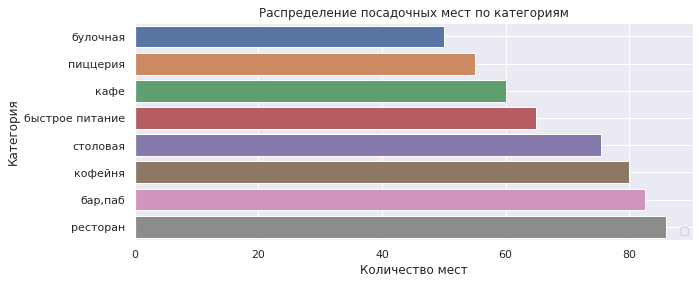

In [18]:
# группируем данные и считаем медиану
df_seats = data.groupby(['category'], as_index = False)[['seats']].median().sort_values(by = 'seats')
# используем стиль dark из библиотеки seaborn
sns.set_style('dark')
# назначаем размер графика
plt.figure(figsize=(10, 4))
# строим столбчатый график средствами seaborn
sns.barplot(x='seats', y='category', data=df_seats)
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение посадочных мест по категориям')
plt.xlabel('Количество мест')
plt.ylabel('Категория')
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='lower right', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

Используем медиану чтобы нивелировать выбросы в данных. 

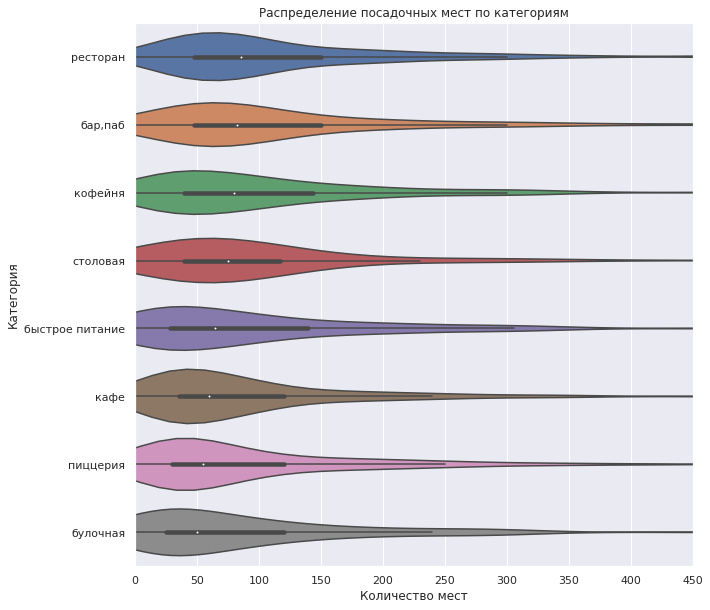

In [19]:
# применяем стиль darkgrid из библиотеки seaborn
sns.set_style('darkgrid')
plt.figure(figsize=(10, 10))
# строим график violinplot средствами seaborn
df_seats = df.groupby(by=["category"])["seats"].median().sort_values().iloc[::-1].index
sns.violinplot(x='seats', y='category', data=df, order=df_seats)
# ограничиваем ось X для наглядности
plt.xlim(0, 450)
# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение посадочных мест по категориям')
plt.xlabel('Количество мест')
plt.ylabel('Категория')
# отображаем график на экране
plt.show()

Из графиков видно что 75% заведений во всех категориях имеет менее 140 посадочных мест. Медианное значение посадочных мест во всех категориях менее 90. Медианное значение значительно меньше среднего, ожидаемо большое стандартное отклонение, неправдоподобно выглядит максимальное значение 1288 и минимальное 0 мест. Скорее всего это ошика ввода данных.

###  Соотношение сетевых и несетевых заведений<a id="research3"></a> 

In [20]:
#посмотрим соотношение сетевых и несетевых заведений
df_chain = df.pivot_table(index=['chain'], values='name', aggfunc=['count']).reset_index()
df_chain.columns = ['chain', 'count']
df_chain.loc[0, 'chain'] = 'несетевое'
df_chain.loc[1, 'chain'] = 'сетевое'

fig = go.Figure(data=[go.Pie(values=df_chain['count'],
                             labels=df_chain['chain'],
                             pull = [0.1, 0.1])])
fig.update_layout(
                  width=700, # указываем размеры графика
                  height=550,
                  annotations=[dict(x=0.55, 
                                    y=1.15,
                                    font_size=15,
                                    text='Распределение заведений по сетям',
                                    showarrow=False)])
fig.show()  

Сетевых заведений на 24% меньше чем не сетевых, 3205 против 5201.

### Какие категории заведений чаще являются сетевыми?<a id="research4"></a> 

In [21]:
#построем топ сетевых заведений по категориям
df_chain = df.pivot_table(index=['category'], columns=['chain'], values='name', aggfunc=['count']).reset_index()
df_chain.columns = ['category', 'no_chain', 'chain']
df_chain['part'] = round(df_chain['chain'] / (df_chain['no_chain'] + df_chain['chain']) *100, 1)
df_chain = df_chain.sort_values(by = 'part')

fig = px.bar(df_chain.sort_values(by = 'part'), # загружаем данные и заново их сортируем
             x='part', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='part' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Доля сетевых заведений в категории',
                   xaxis_title='Доля сетевых заведений',
                   yaxis_title='Категория заведения')
fig.show() 

Чаще всего сетевыми являются булочные (61.3%), пицерии (52.1%), кофейни (51%).

### Топ-15 популярных сетей в Москве<a id="research5"></a> 

In [22]:
#построем топ 15 популярных сетей
top_15 = df[df.chain == 1].pivot_table(index=['name'], values='category', aggfunc=['count'])
top_15.columns = ['count']
top_15 = top_15.sort_values(by = 'count', ascending = False)[:15].reset_index()

fig = px.bar(top_15.sort_values(by='count', ascending=True), # загружаем данные и заново их сортируем
             x='count', # указываем столбец с данными для оси X
             y='name', # указываем столбец с данными для оси Y
             text='count' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Топ-15 популярных сетей по количеству заведений',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название заведения')
fig.show() # выводим график

Среди топ-15 много заведений с доставкой Шоколадница, Домино'с Пицца, Додо Пицца, Яндекс Лавка. Это достигается в том числе большим количеством точек. 

### Административные районы<a id="research6"></a> 

In [23]:
#глянем какие вообще есть районы
print('В датасете представлены районы:', df['district'].unique())

В датасете представлены районы: ['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']


In [24]:
district_category = df.groupby(['category', 'district'], as_index=False)[['name']].\
    count().sort_values(by = 'name', ascending = False).reset_index(drop=True)

fig = px.bar(district_category, # загружаем данные и заново их сортируем
             x='district', # указываем столбец с данными для оси X
             y='name', # указываем столбец с данными для оси Y
             color='category', # обозначаем категорию для разделения цветом
             text='name' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Распределение заведений по округам',
                   xaxis_title='Округ',
                   yaxis_title='Количество заведений')
fig.update_xaxes(categoryorder='total descending')
fig.show()

По всей совокупности заведений из представленных 9 округов лидирует Центральный округ, более 2000 заведений, наименьшее в Северо-Западном (менее 500).

### Распределение средних рейтингов по категориям заведений<a id="research7"></a> 

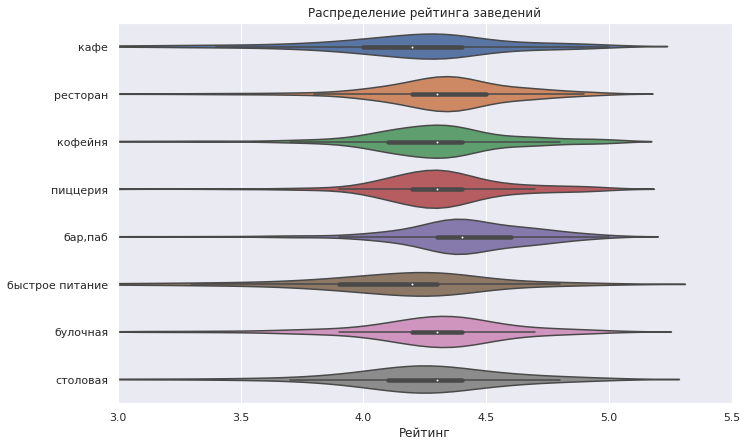

In [25]:
# применяем стиль darkgrid из библиотеки seaborn
sns.set_style('darkgrid')
plt.figure(figsize=(11, 7))
# строим график violinplot средствами seaborn
ax = sns.violinplot(y="category", x="rating", data=df)
# ограничиваем ось X для наглядности
plt.xlim(3, 5.5)
plt.title('Распределение рейтинга заведений')
plt.xlabel('Рейтинг')
plt.ylabel(None);

Видно, что и среднее и медианное значение во всех категориях больше 4. Так же присутствуют выбросы.

In [26]:
category_rating = df.pivot_table(index=['category'], values='rating', aggfunc=['mean'])
category_rating.columns = ['mean']
category_rating['mean'] = round(category_rating['mean'], 2)
category_rating = category_rating.sort_values(by = 'mean', ascending = False).reset_index()

fig = px.bar(category_rating.sort_values(by='mean', ascending=True), # загружаем данные и заново их сортируем
             x='mean', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='mean' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Средний рейтинг категорий',
                   xaxis_title='Средний рейтинг',
                   yaxis_title='Категория заведения')
fig.update_xaxes(
    range=[4, 4.4]  # ограничение графика
)
fig.show() # выводим график

Бары и пабы имеют наибольшие стредние оченки в то время как заведения быстрого питания имеют самые низкие.

### Фоновая картограмма со средним рейтингом заведений каждого района<a id="research8"></a> 

In [27]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('median')
with open(r'/datasets/admin_level_geomap.geojson') as f:
    geo_json = json.load(f)
state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту

folium.Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.6,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

folium.LayerControl().add_to(m)
# выводим карту
m

Наибольший рейтинг в Центральном округе 4.4, наименьший в Юго-Восточном и Северо-Восточном 4.2.

### Все заведения на карте <a id="research9"></a> 

In [28]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

Видно что более трети заведений сосредочены в центре Москвы

### Топ-15 улиц по количеству заведений<a id="research10"></a> 

In [29]:
#подготовим данные к визуализации
top_list = list(df['street'].value_counts()[:15].index)
top_street = df[df['street'].isin(top_list)]
top_street = top_street.groupby(['category', 'street'], as_index=False)[['name']].\
    count().sort_values(by = 'name', ascending = False).reset_index(drop=True)

fig = px.bar(top_street, # загружаем данные и заново их сортируем
             x='street', # указываем столбец с данными для оси X
             y='name', # указываем столбец с данными для оси Y
             color='category', # обозначаем категорию для разделения цветом
             text='name' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Распределение заведений по улицам',
                   xaxis_title='Улица',
                   yaxis_title='Количество заведений')
fig.update_xaxes(categoryorder='total descending')
fig.show()

Лидирует проспект Мира

### Улицы с одним заведением<a id="research11"></a> 

In [30]:
#найдем все нужные улицы
street_one = df.groupby(['street'], as_index=False)[['name']].count().reset_index(drop=True)
street_one = street_one.query('name == 1')
street_one = list(street_one['street'])
street_one = df[df.street.isin(street_one)]

In [31]:
#распределение заведений с одной улицей по категориям
df_street = street_one.groupby('category', as_index=False).agg({'name': 'nunique'}).\
    sort_values(by = 'name', ascending = False).reset_index(drop=True)

fig = go.Figure(data=[go.Pie(labels=df_street['category'], 
                             values=df_street['name'],
                             pull = [0.1, 0.1, 0.1])])
fig.update_layout(
                  width=700, # указываем размеры графика
                  height=550,
                  annotations=[dict(x=0.55, 
                                    y=1.15,
                                    font_size=15,
                                    text='Распределение одиночных заведений по категориям',
                                    showarrow=False)])
fig.show() 

Среди одиночных заведений наибольшую долю занимают кафе (33,4%), рестораны (21,1%), кофейни (18,4%), наименьшую пицерии и булочные - 2,95% и 1,97% соответственно

In [32]:
#посмотрим рейтинги одиночных ресторанов
category_rating = street_one.pivot_table(index=['category'], values='rating', aggfunc=['mean'])
category_rating.columns = ['mean']
category_rating['mean'] = round(category_rating['mean'], 2)
category_rating = category_rating.sort_values(by = 'mean', ascending = False).reset_index()

fig = px.bar(category_rating.sort_values(by='mean', ascending=True), # загружаем данные и заново их сортируем
             x='mean', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='mean' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Средний рейтинг категорий',
                   xaxis_title='Средний рейтинг',
                   yaxis_title='Категория заведения')
fig.update_xaxes(
    range=[4, 4.5])

fig.show() # выводим график

Рейтинги одиночных заведений немного выше их сетевых собратьев.

### Медианные чеки заведений по районам<a id="research12"></a> 

In [33]:
df_avg_bill = df.groupby('district', as_index=False)['middle_avg_bill'].\
    agg('median').sort_values(by = 'middle_avg_bill', ascending = False).reset_index(drop=True)
# создаём карту Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту

folium.Choropleth(
    geo_data=state_geo,
    data=df_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.5,
    legend_name='Медианный чек заведений по районам',
).add_to(m)

folium.LayerControl().add_to(m)
# выводим карту
m

По медианным ценам явными лидерами являются Центральный и Западный округа (чек равен 1000р.). Хорошо видно, что отдаление от Западного округа (вокруг Центрального округа) сопровождается уменьшением чека, достигая минимума 450р.

### Выводы<a id="research13"></a> 
* Наибольшую долю занимают кафе 29,1%, рестораны 25,7%, кофейни 13.9%, наименьшую столовые и булочные - 4.07% и 2.32% соответственно.
* Из графиков видно что 75% заведений во всех категориях имеет менее 140 посадочных мест. Медианное значение посадочных мест во всех категориях менее 90. Медианное значение значительно меньше среднего, ожидаемо большое стандартное отклонение, неправдоподобно выглядит максимальное значение 1288 и минимальное 0 мест. Скорее всего это ошика ввода данных.
* Сетевых заведений на 24% меньше чем не сетевых, 3205 против 5201.
* Чаще всего сетевыми являются булочные (61.3%), пицерии (52.1%), кофейни (51%).
* Топ-15 популярных сетей:
'Шоколадница', "Домино'с Пицца", 'Додо Пицца', 'One Price Coffee', 'Яндекс Лавка', 'Cofix', 'Prime', 'Хинкальная', 'КОФЕПОРТ', 'Кулинарная лавка братьев Караваевых', 'Теремок', 'Чайхана', 'Буханка', 'CofeFest', 'Му-Му'.
* Среди топ-15 много заведений с доставкой Шоколадница, Домино'с Пицца, Додо Пицца, Яндекс Лавка. Это достигается в том числе большим количеством точек.
* По всей совокупности заведений из представленных 9 округов лидирует Центральный округ, более 2000 заведений, наименьшее - как и в топ 15 в Северо-Западном (менее 500).
* Из анализа видно, что и среднее и медианное значение рейтинга во всех категориях больше 4. Так же присутствуют выбросы.
* Визуализация показала что, наибольший рейтинг в Центральном округе 4.4, наименьший в Юго-Восточном и Северо-Восточном 4.2.
* Визуализация заведений с объединением по кластерам показала, что более трети заведений сосредочены в центре Москвы.
* Топ-15 популярных улиц:
'проспект Мира', 'Профсоюзная улица', 'проспект Вернадского', 'Ленинский проспект', 'Ленинградский проспект', 'Дмитровское шоссе', 'Каширское шоссе', 'Варшавское шоссе', 'Ленинградское шоссе', 'МКАД', 'Люблинская улица', 'улица Вавилова', 'Кутузовский проспект', 'улица Миклухо-Маклая', 'Пятницкая улица'.
* Среди одиночных заведений наибольшую долю занимают кафе (33,4%), рестораны (21,1%), кофейни (18,4%), наименьшую пицерии и булочные - 2,95% и 1,97% соответственно
* По медианным ценам явными лидерами являются Центральный и Западный округа (чек равен 1000р.). Хорошо видно, что отдаление от Западного округа (вокруг Центрального округа) сопровождается уменьшением чека, достигая минимума 450р.

## Исследование рынка кофеен<a id="research14"></a> 
1. Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
2. Есть ли круглосуточные кофейни?
3. Какие у кофеен рейтинги? Как они распределяются по районам?
4. На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

### Сколько всего кофеен в датасете?<a id="research15"></a> 

In [34]:
#отфильтруем датасет оставив только кофейни
df_coffee = df.query('category == "кофейня"')
df_coffee.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 1413 entries, 3 to 8400
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1413 non-null   object 
 1   category           1413 non-null   object 
 2   address            1413 non-null   object 
 3   district           1413 non-null   object 
 4   hours              1398 non-null   object 
 5   lat                1413 non-null   float64
 6   lng                1413 non-null   float64
 7   rating             1413 non-null   float64
 8   price              506 non-null    object 
 9   avg_bill           721 non-null    object 
 10  middle_avg_bill    200 non-null    float64
 11  middle_coffee_cup  521 non-null    float64
 12  chain              1413 non-null   int64  
 13  seats              751 non-null    float64
 14  street             1413 non-null   object 
 15  is_24/7            1398 non-null   object 
dtypes: float64(6), int64(1),

В данных нашлось 1413 кофеен

### Есть ли круглосуточные кофейни?<a id="research16"></a> 

In [35]:
#посмотрим соотношение сетевых и несетевых заведений
df_24 = df_coffee.pivot_table(index=['is_24/7'], values='name', aggfunc=['count']).reset_index()
df_24.columns = ['is_24/7', 'count']
df_24.loc[0, 'is_24/7'] = 'не кругосуточный'
df_24.loc[1, 'is_24/7'] = 'кругосуточный'

fig = go.Figure(data=[go.Pie(values=df_24['count'],
                             labels=df_24['is_24/7'],
                             pull = [0.1, 0.1])])
fig.update_layout(
                  width=700, # указываем размеры графика
                  height=550,
                  annotations=[dict(x=0.55, 
                                    y=1.15,
                                    font_size=15,
                                    text='Распределение кофеен по времени работы',
                                    showarrow=False)])
fig.show()  

Лишь 4,22% кофеен являются кругосуточными

### Какие у кофеен рейтинги?<a id="research17"></a> 

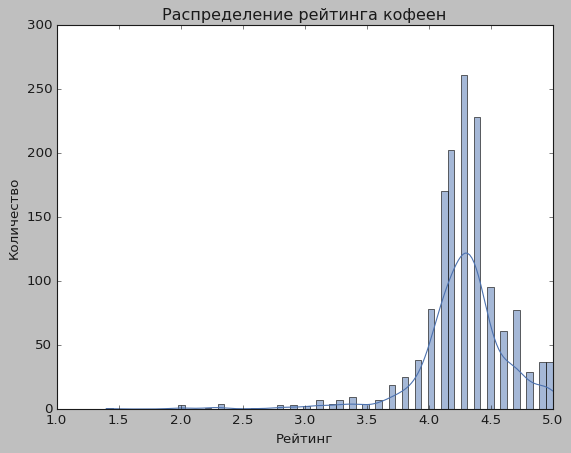

In [36]:
#посмотрим распределение оценок кофеен
# назначаем classic стиль для графика с помощью matplotlib
plt.style.use('classic')
# строим гистограмму для столбца добавив график кривой KDE
sns.histplot(x='rating', data=df_coffee, kde=True)
# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение рейтинга кофеен')
plt.xlabel('Рейтинг')
plt.ylabel('Количество')
# отображаем график на экране
plt.show()

In [37]:
#посмотрим рейтинги кофеен. Рассмотрим разницу рейтингов по округам
rating_coffee = df_coffee.groupby('district', as_index=False)['rating'].agg('median').\
    sort_values(by = 'rating', ascending = False).reset_index(drop=True)

fig = px.bar(rating_coffee, x='district', y='rating', text='rating')
fig.update_layout(title='Медианный рейтинг по округам',
                   xaxis_title=None,
                   xaxis_tickangle=45,
                   yaxis_title='Рейтинг')
fig.update_yaxes(range=[4.0, 4.4])
fig.show() 

In [38]:
data['rating'].describe(percentiles=[0.05, 1/4, 1/2, 3/4, 0.95, 0.99]).T

count   8406.00
mean       4.23
std        0.47
min        1.00
5%         3.40
25%        4.10
50%        4.30
75%        4.40
95%        4.80
99%        5.00
max        5.00
Name: rating, dtype: float64

В целом кофейни во всех округах имеют одинаковый рейтинг 4.3, выделяется только Западный административный округ с чуть меньшим результатом 4.2

### На какую стоимость чашки капучино стоит ориентироваться при открытии?<a id="research18"></a> 

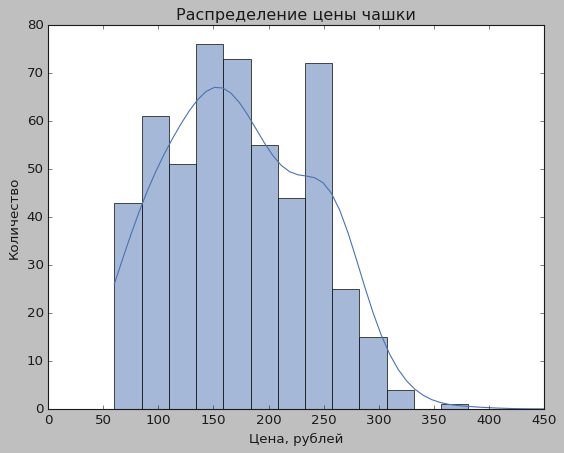

In [39]:
#посмотрим распределение цены чашки кофе
# назначаем classic стиль для графика с помощью matplotlib
plt.style.use('classic')
# строим гистограмму для столбца добавив график кривой KDE
sns.histplot(x='middle_coffee_cup', data=df_coffee, kde=True)
# ограничиваем ось X для наглядности
plt.xlim(0, 450)
# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение цены чашки')
plt.xlabel('Цена, рублей')
plt.ylabel('Количество')
# отображаем график на экране
plt.show()

In [40]:
#посмотрим на стоимость чашки кофе по округам
coffee = df_coffee.groupby(['district'], as_index=False)['middle_coffee_cup'].\
    agg('median').sort_values(by = 'middle_coffee_cup', ascending = False).reset_index(drop=True)

fig = px.bar(coffee, x='district', y='middle_coffee_cup', text='middle_coffee_cup')
fig.update_layout(title='Медианная цена чашки капучино',
                   xaxis_title=None,
                   xaxis_tickangle=45,
                   yaxis_title='Цена, рублей')
fig.show() 

Медианная цена чашки капучино колеблется от 135 рублей в Восточном округе до почти 198 рублей в Юго-Западном. В лидерах также Центральный и Западный округа с ценой 190 и 189 рублей соответственно.

### Построем визуализацию других идей<a id="research19"></a> 

In [41]:
#посмотрим на распределение кофеен по районам добавил растпределение для кругосуточных кофеен
coffee = df_coffee.groupby(['is_24/7','district'], as_index=False)[['name']].count().\
    sort_values(by = 'name', ascending = False).reset_index(drop=True)

fig = px.bar(coffee, # загружаем данные и заново их сортируем
             x='district', # указываем столбец с данными для оси X
             y='name', # указываем столбец с данными для оси Y
             color='is_24/7', # обозначаем категорию для разделения цветом
             text='name' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Распределение кофеен по округам',
                   xaxis_title='Округ',
                   yaxis_title='Количество кофеен')
fig.show()

In [42]:
#глянем средний чек кофеен
coffee = df_coffee.groupby('district', as_index=False)['middle_avg_bill'].agg('median').\
    sort_values(by = 'middle_avg_bill', ascending = False).reset_index(drop=True)

fig = px.bar(coffee, x='district', y='middle_avg_bill', text='middle_avg_bill')
fig.update_layout(title='Медианный чек по округам',
                   xaxis_title=None,
                   xaxis_tickangle=45,
                   yaxis_title='Медианный чек, рублей')
fig.show() 

In [43]:
#создадим карту и отметир расположение кофеен
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df_coffee.apply(create_clusters, axis=1)

# выводим карту
m

### Выводы<a id="research20"></a> 
* В датасэте 1413 кофеен. Наибольшее колличество кофеен в центральном округе 428 (почти треть). В других округах кофеен значительно меньше, а в Северо-Западном всего 62. 
* Лишь 4,22% кофеен являются кругосуточными
* В целом кофейни во всех округах имеют одинаковый рейтинг 4.3, выделяется только Западный административный округ с чуть меньшим результатом 4.2
* Медианная цена чашки капучино колеблется от 135 рублей в Восточном округе до почти 198 рублей в Юго-Западном. В лидерах также Центральный и Западный округа с ценой 190 и 189 рублей соответственно.

## Презентация<a id="presentation"></a> 

Презентация: <https://disk.yandex.ru/i/VyHerl7Zg45NJw> 

## Заключение<a id="end"></a> 

### Выводы<a id="end1"></a> 

* Наибольшую долю занимают кафе 29,1%, рестораны 25,7%, кофейни 13.9%, наименьшую столовые и булочные - 4.07% и 2.32% соответственно.
* Из графиков видно что 75% заведений во всех категориях имеет менее 140 посадочных мест. Медианное значение посадочных мест во всех категориях менее 90. Медианное значение значительно меньше среднего, ожидаемо большое стандартное отклонение, неправдоподобно выглядит максимальное значение 1288 и минимальное 0 мест. Скорее всего это ошика ввода данных.
* Сетевых заведений на 24% меньше чем не сетевых, 3205 против 5201.
* Чаще всего сетевыми являются булочные (61.3%), пицерии (52.1%), кофейни (51%).
* Топ-15 популярных сетей:
'Шоколадница', "Домино'с Пицца", 'Додо Пицца', 'One Price Coffee', 'Яндекс Лавка', 'Cofix', 'Prime', 'Хинкальная', 'КОФЕПОРТ', 'Кулинарная лавка братьев Караваевых', 'Теремок', 'Чайхана', 'Буханка', 'CofeFest', 'Му-Му'.
* Среди заведений топ-15 хорошо известные своей быстрой доставкой Шоколадница, Домино'с Пицца, Додо Пицца, Яндекс Лавка. Это достигается в том числе большим количеством точек.
* По всей совокупности заведений из представленных 9 округов лидирует Центральный округ, более 2000 заведений, наименьшее в Северо-Западном (менее 500).
* Из анализа видно, что и среднее и медианное значение рейтинга во всех категориях больше 4. Так же присутствуют выбросы.
* Визуализация показала что, наибольший рейтинг в Центральном округе 4.4, наименьший в Юго-Восточном и Северо-Восточном 4.2.
* Визуализация заведений с объединением по кластерам показала, что более трети заведений сосредочены в центре Москвы.
* Топ-15 популярных улиц:
'проспект Мира', 'Профсоюзная улица', 'проспект Вернадского', 'Ленинский проспект', 'Ленинградский проспект', 'Дмитровское шоссе', 'Каширское шоссе', 'Варшавское шоссе', 'Ленинградское шоссе', 'МКАД', 'Люблинская улица', 'улица Вавилова', 'Кутузовский проспект', 'улица Миклухо-Маклая', 'Пятницкая улица'.
* Среди одиночных заведений наибольшую долю занимают кафе (33,4%), рестораны (21,1%), кофейни (18,4%), наименьшую пицерии и булочные - 2,95% и 1,97% соответственно
* По медианным ценам явными лидерами являются Центральный и Западный округа (чек равен 1000р.). Хорошо видно, что отдаление от Западного округа (вокруг Центрального округа) сопровождается уменьшением чека, достигая минимума 450р.


* В датасэте 1413 кофеен. Наибольшее колличество кофеен в центральном округе 428 (почти треть). В других округах кофеен значительно меньше, а в Северо-Западном всего 62.
* Лишь 4,22% кофеен являются кругосуточными
* В целом кофейни во всех округах имеют одинаковый рейтинг 4.3, выделяется только Западный административный округ с чуть меньшим результатом 4.2
* Медианная цена чашки капучино колеблется от 135 рублей в Восточном округе до почти 198 рублей в Юго-Западном. В лидерах также Центральный и Западный округа с ценой 190 и 189 рублей соответственно.

### Рекомендации<a id="end2"></a> 

Из проведенного анализа видно, что:

1. Перспективными округами для открытия заведения являются Центральный и Западный (посететели охотнее оставляют больше денег в заведениях Центрального и Западного округов, медианный чек и медианная цена чашки в них наибольшая.
2. При выборе места стоит ориентироваться на большой поток людей. Это туристическая часть города, выходы из метро, театры и кинотеатры, стадионы и торговые центры.
3. Перспективны улицы с одним заведением отсутствие конкурентов хорошо скажется на потолке цен а так же у подобных заведений в среднем рейтинг выше.
4. При открытии кофейни в Центральном или Западном округах можно ориентироваться на средний чек 600 рублей и среднюю стоимость чашки капучино 190 рублей;
5. Ниша круглосуточных заведений свободна, подобных кофеен всего 4% заведений.
6. У кофеен в среднем одинаковые рейтинги по городу. Инвистиции в рекламу и хорошие отзывы позволят иметь большие рейтинги чем в среднем и выделиться.
7. Возможно стоит озаботиться доставкой еды.